In [3]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manual_seed = 42
# manual_seed = random.randint(1, 10000)
print("Random Seed: ", manual_seed)
random.seed(manual_seed)
torch.manual_seed(manual_seed)
torch.use_deterministic_algorithms(True)

Random Seed:  42


In [52]:
# config
dataroot = '../.images/'
workers = 2
batch_size = 4
image_size = 256  # Changed from 256 - DCGAN was designed for 64x64 images

num_channels = 3

nz = 100 
"""latent vector len"""
ngf = 64
"""generator feature map depth (channels)"""
ndf = 64 
"""discriminator feature map depth (channels)"""

num_epochs = 5
learning_rate = 0.0002
beta1 = 0.5
ngpu = 1

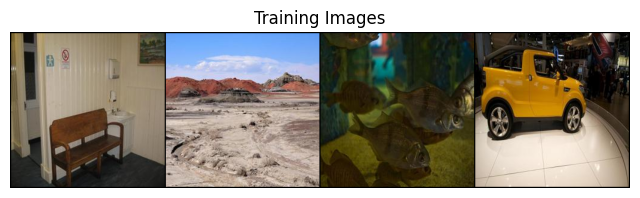

In [53]:
dataset = ImageFolder(root=dataroot, transform=transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [14]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, num_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [35]:
# generator for image inpainting, size 256x256
class BigGenerator(nn.Module):
    def __init__(self, ngpu):
        super(BigGenerator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # state size 3x256x256
            nn.Conv2d(num_channels, ngf, kernel_size=5, padding="same", bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size ngf x 256 x 256
            nn.Conv2d(ngf, ngf, kernel_size=3, padding="same", bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size ngf x 256 x 256
            nn.Conv2d(ngf, ngf, kernel_size=3, padding="same", bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size ngf x 256 x 256
            nn.Conv2d(ngf, ngf, kernel_size=3, padding="same", bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size ngf x 256 x 256
            nn.Conv2d(ngf, num_channels, kernel_size=3, padding="same", bias=False),
            nn.Tanh()
            # state size 3 x 256 x 256
        )
    
    def forward(self, input):
        return self.main(input)

In [16]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(num_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [74]:
class DebugPrint(nn.Module):
    def __init__(self, name):
        super(DebugPrint, self).__init__()
        self.name = name

    def forward(self, input):
        print(f"DebugPrint: {self.name} {input.shape}")
        return input

In [81]:
class BigDiscriminator(nn.Module):
    def __init__(self, ngpu):
        super(BigDiscriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input size 3 x 256 x 256
            nn.Conv2d(num_channels, ndf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size ndf x 128 x 128
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*2) x 64 x 64
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*4) x 32 x 32
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*8) x 16 x 16
            nn.Conv2d(ndf * 8, ndf * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*8) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            # state size 1 x 1 x 1
        )
    
    def forward(self, input):
        return self.main(input)

In [26]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [27]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=learning_rate, betas=(beta1, 0.999))

In [28]:
from tqdm.notebook import tqdm

In [42]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in tqdm(range(num_epochs)):
    # For each batch in the dataloader
    for i, data in tqdm(enumerate(dataloader, 0)):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        print("input", real_cpu)
        print("out", output)
        print("label", label)
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


  0%|          | 0/5 [00:00<?, ?it/s]

0it [00:00, ?it/s]

input tensor([[[[-0.5137, -0.6392, -0.6549,  ..., -0.0745,  0.1451,  0.2157],
          [-0.7255, -0.7569, -0.5373,  ..., -0.5686, -0.3020, -0.2235],
          [-0.8667, -0.5922, -0.4824,  ..., -0.5059, -0.2078, -0.2392],
          ...,
          [-0.6078, -0.5765, -0.6392,  ..., -0.5686, -0.5765, -0.5922],
          [-0.6863, -0.5765, -0.6078,  ..., -0.6078, -0.6235, -0.6392],
          [-0.7882, -0.6941, -0.6784,  ..., -0.6392, -0.6549, -0.6627]],

         [[-0.5686, -0.6706, -0.7098,  ..., -0.4431, -0.2627, -0.1373],
          [-0.7569, -0.7725, -0.5686,  ..., -0.7176, -0.5922, -0.5686],
          [-0.8824, -0.5922, -0.4980,  ..., -0.6941, -0.5059, -0.6627],
          ...,
          [-0.8275, -0.8196, -0.8667,  ..., -0.4902, -0.5059, -0.5451],
          [-0.8588, -0.7882, -0.8275,  ..., -0.5294, -0.5529, -0.5922],
          [-0.8980, -0.8510, -0.8588,  ..., -0.5608, -0.5922, -0.6157]],

         [[-0.5765, -0.6471, -0.6863,  ..., -0.5216, -0.3725, -0.2235],
          [-0.7882, -0.7

KeyboardInterrupt: 

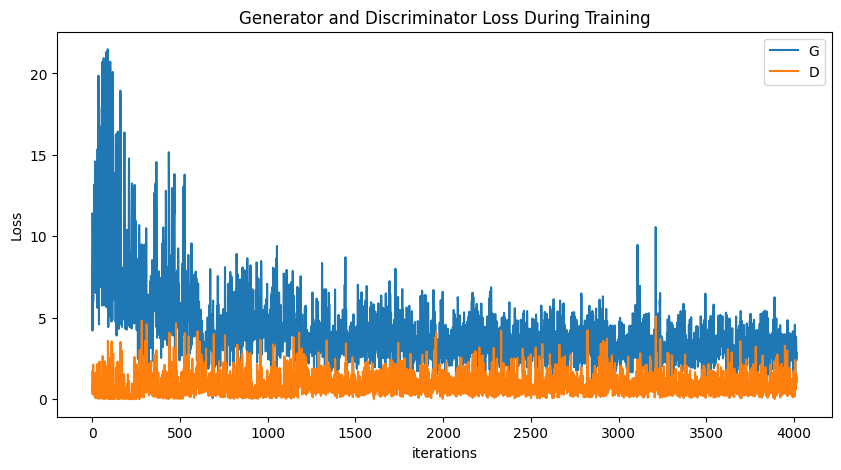

In [30]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

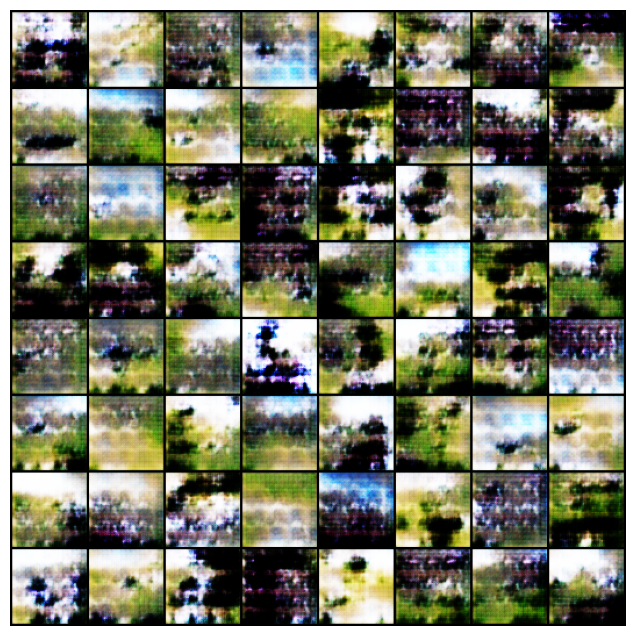

In [31]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

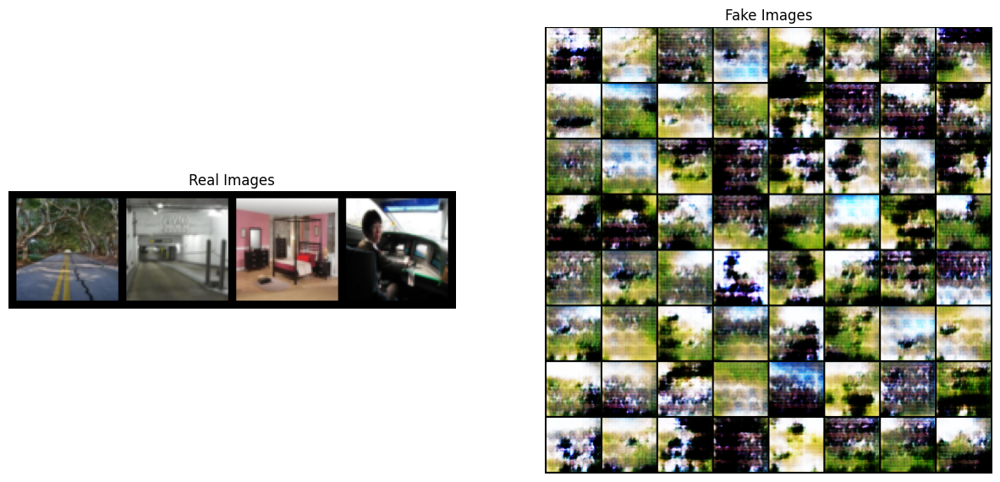

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

---

In [54]:
netG2 = BigGenerator(ngpu).to(device)
netG2.apply(weights_init)
print(netG2)

BigGenerator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=same, bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
    (13): Tanh()
  )
)


In [82]:
netD2 = BigDiscriminator(ngpu).to(device)
netD2.apply(weights_init)
print(netD2)

BigDiscriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-0

In [93]:
dl_iter = iter(dataloader)

In [95]:
next(dl_iter)[0].shape

torch.Size([4, 3, 256, 256])

In [96]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of masked images that we will use to visualize
#  the progression of the generator
test_batch = next(dl_iter)[0].to(device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD2 = optim.Adam(netD.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG2 = optim.Adam(netG.parameters(), lr=learning_rate, betas=(beta1, 0.999))

In [65]:
a = next(iter(dataloader))

In [67]:
a[0].shape

torch.Size([4, 3, 256, 256])

In [83]:
with torch.no_grad():
    o = netD2(a[0].to(device))
    print(o.shape)

torch.Size([4, 1, 1, 1])


In [86]:
from utils.masking import mask_batch

In [97]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in tqdm(range(num_epochs)):
    # For each batch in the dataloader
    for i, data in tqdm(enumerate(dataloader, 0)):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD2.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD2(real_cpu).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of masked images
        masked = mask_batch(real_cpu)
        # Generate fake image batch with G
        fake = netG2(masked)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD2(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD2.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG2.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD2(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG2.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on test_batch
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG2(test_batch).detach().cpu()
            img_list.append(make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


  0%|          | 0/5 [00:00<?, ?it/s]

0it [00:00, ?it/s]

[0/5][0/803]	Loss_D: 1.5960	Loss_G: 0.5786	D(x): 0.8281	D(G(z)): 0.6137 / 0.6137
[0/5][50/803]	Loss_D: 1.9207	Loss_G: 0.5562	D(x): 0.3924	D(G(z)): 0.5825 / 0.5825
[0/5][100/803]	Loss_D: 1.0670	Loss_G: 0.9868	D(x): 0.6852	D(G(z)): 0.4372 / 0.4372
[0/5][150/803]	Loss_D: 1.8288	Loss_G: 0.7601	D(x): 0.4884	D(G(z)): 0.5228 / 0.5228
[0/5][200/803]	Loss_D: 1.0090	Loss_G: 0.6642	D(x): 0.8050	D(G(z)): 0.5197 / 0.5197
[0/5][250/803]	Loss_D: 2.1871	Loss_G: 0.4660	D(x): 0.6880	D(G(z)): 0.6772 / 0.6772
[0/5][300/803]	Loss_D: 1.8389	Loss_G: 0.7037	D(x): 0.4775	D(G(z)): 0.5617 / 0.5617
[0/5][350/803]	Loss_D: 1.9482	Loss_G: 0.4382	D(x): 0.5354	D(G(z)): 0.6784 / 0.6784
[0/5][400/803]	Loss_D: 1.5192	Loss_G: 0.6232	D(x): 0.5866	D(G(z)): 0.5639 / 0.5639
[0/5][450/803]	Loss_D: 1.3240	Loss_G: 0.8600	D(x): 0.5072	D(G(z)): 0.4360 / 0.4360
[0/5][500/803]	Loss_D: 0.9744	Loss_G: 1.0794	D(x): 0.6686	D(G(z)): 0.3661 / 0.3661
[0/5][550/803]	Loss_D: 1.9579	Loss_G: 0.3440	D(x): 0.6546	D(G(z)): 0.7282 / 0.7282
[0/5][6

0it [00:00, ?it/s]

[1/5][0/803]	Loss_D: 1.0002	Loss_G: 1.4008	D(x): 0.5533	D(G(z)): 0.2873 / 0.2873
[1/5][50/803]	Loss_D: 2.1673	Loss_G: 0.2240	D(x): 0.7768	D(G(z)): 0.8087 / 0.8087
[1/5][100/803]	Loss_D: 1.2265	Loss_G: 0.5621	D(x): 0.7691	D(G(z)): 0.5903 / 0.5903
[1/5][150/803]	Loss_D: 1.5265	Loss_G: 0.7520	D(x): 0.5927	D(G(z)): 0.5221 / 0.5221
[1/5][200/803]	Loss_D: 1.6140	Loss_G: 0.4244	D(x): 0.6673	D(G(z)): 0.6663 / 0.6663
[1/5][250/803]	Loss_D: 1.2207	Loss_G: 0.7673	D(x): 0.6399	D(G(z)): 0.4763 / 0.4763
[1/5][300/803]	Loss_D: 1.3560	Loss_G: 0.7403	D(x): 0.6146	D(G(z)): 0.5033 / 0.5033
[1/5][350/803]	Loss_D: 1.7894	Loss_G: 1.0451	D(x): 0.3721	D(G(z)): 0.4531 / 0.4531
[1/5][400/803]	Loss_D: 1.3110	Loss_G: 0.4968	D(x): 0.7819	D(G(z)): 0.6254 / 0.6254
[1/5][450/803]	Loss_D: 2.1350	Loss_G: 0.6845	D(x): 0.5276	D(G(z)): 0.5674 / 0.5674
[1/5][500/803]	Loss_D: 1.2477	Loss_G: 0.6419	D(x): 0.7210	D(G(z)): 0.5475 / 0.5475
[1/5][550/803]	Loss_D: 1.4510	Loss_G: 0.5079	D(x): 0.7238	D(G(z)): 0.6191 / 0.6191
[1/5][6

0it [00:00, ?it/s]

[2/5][0/803]	Loss_D: 1.0403	Loss_G: 0.8068	D(x): 0.7302	D(G(z)): 0.4709 / 0.4709
[2/5][50/803]	Loss_D: 1.8582	Loss_G: 0.4701	D(x): 0.4961	D(G(z)): 0.6423 / 0.6423
[2/5][100/803]	Loss_D: 1.1085	Loss_G: 0.8960	D(x): 0.7978	D(G(z)): 0.4725 / 0.4725
[2/5][150/803]	Loss_D: 1.5001	Loss_G: 0.7407	D(x): 0.5047	D(G(z)): 0.4934 / 0.4934
[2/5][200/803]	Loss_D: 1.3916	Loss_G: 0.7294	D(x): 0.5933	D(G(z)): 0.5288 / 0.5288
[2/5][250/803]	Loss_D: 2.1569	Loss_G: 0.2147	D(x): 0.6806	D(G(z)): 0.8104 / 0.8104
[2/5][300/803]	Loss_D: 1.5039	Loss_G: 0.8877	D(x): 0.5110	D(G(z)): 0.4589 / 0.4589
[2/5][350/803]	Loss_D: 1.2329	Loss_G: 1.3390	D(x): 0.6752	D(G(z)): 0.4620 / 0.4620
[2/5][400/803]	Loss_D: 1.0306	Loss_G: 1.1395	D(x): 0.5911	D(G(z)): 0.3476 / 0.3476
[2/5][450/803]	Loss_D: 1.2805	Loss_G: 0.7084	D(x): 0.7384	D(G(z)): 0.5286 / 0.5286
[2/5][500/803]	Loss_D: 1.3506	Loss_G: 0.6742	D(x): 0.6190	D(G(z)): 0.5424 / 0.5424
[2/5][550/803]	Loss_D: 2.4861	Loss_G: 0.1591	D(x): 0.7335	D(G(z)): 0.8560 / 0.8560
[2/5][6

0it [00:00, ?it/s]

[3/5][0/803]	Loss_D: 1.9144	Loss_G: 0.3929	D(x): 0.5812	D(G(z)): 0.6901 / 0.6901
[3/5][50/803]	Loss_D: 1.4864	Loss_G: 0.8171	D(x): 0.5426	D(G(z)): 0.4978 / 0.4978
[3/5][100/803]	Loss_D: 2.5784	Loss_G: 0.5867	D(x): 0.4783	D(G(z)): 0.6128 / 0.6128
[3/5][150/803]	Loss_D: 1.2649	Loss_G: 1.2641	D(x): 0.6239	D(G(z)): 0.3713 / 0.3713
[3/5][200/803]	Loss_D: 1.7325	Loss_G: 0.6164	D(x): 0.4538	D(G(z)): 0.5425 / 0.5425
[3/5][250/803]	Loss_D: 1.4066	Loss_G: 0.8882	D(x): 0.6392	D(G(z)): 0.5282 / 0.5282
[3/5][300/803]	Loss_D: 2.3741	Loss_G: 0.2450	D(x): 0.7534	D(G(z)): 0.8003 / 0.8003
[3/5][350/803]	Loss_D: 1.2914	Loss_G: 0.6758	D(x): 0.7653	D(G(z)): 0.5789 / 0.5789
[3/5][400/803]	Loss_D: 2.4128	Loss_G: 0.2671	D(x): 0.5611	D(G(z)): 0.7797 / 0.7797
[3/5][450/803]	Loss_D: 1.2148	Loss_G: 0.5504	D(x): 0.7521	D(G(z)): 0.5882 / 0.5882
[3/5][500/803]	Loss_D: 2.2503	Loss_G: 0.5072	D(x): 0.4220	D(G(z)): 0.6312 / 0.6312
[3/5][550/803]	Loss_D: 1.8525	Loss_G: 0.3497	D(x): 0.6663	D(G(z)): 0.7152 / 0.7152
[3/5][6

0it [00:00, ?it/s]

[4/5][0/803]	Loss_D: 1.4324	Loss_G: 0.6585	D(x): 0.6186	D(G(z)): 0.5651 / 0.5651
[4/5][50/803]	Loss_D: 1.4811	Loss_G: 1.1290	D(x): 0.4802	D(G(z)): 0.3879 / 0.3879
[4/5][100/803]	Loss_D: 1.4558	Loss_G: 0.7325	D(x): 0.5245	D(G(z)): 0.5083 / 0.5083
[4/5][150/803]	Loss_D: 1.6198	Loss_G: 0.5809	D(x): 0.6166	D(G(z)): 0.5859 / 0.5859
[4/5][200/803]	Loss_D: 2.1894	Loss_G: 0.4563	D(x): 0.6519	D(G(z)): 0.6670 / 0.6670
[4/5][250/803]	Loss_D: 1.1529	Loss_G: 0.9611	D(x): 0.5681	D(G(z)): 0.4048 / 0.4048
[4/5][300/803]	Loss_D: 1.4924	Loss_G: 0.5307	D(x): 0.6434	D(G(z)): 0.6109 / 0.6109
[4/5][350/803]	Loss_D: 1.3269	Loss_G: 1.1654	D(x): 0.5864	D(G(z)): 0.4856 / 0.4856
[4/5][400/803]	Loss_D: 2.0724	Loss_G: 0.5865	D(x): 0.5038	D(G(z)): 0.6554 / 0.6554
[4/5][450/803]	Loss_D: 1.0460	Loss_G: 0.8239	D(x): 0.6699	D(G(z)): 0.4450 / 0.4450
[4/5][500/803]	Loss_D: 1.6659	Loss_G: 0.4470	D(x): 0.6440	D(G(z)): 0.6575 / 0.6575
[4/5][550/803]	Loss_D: 1.8127	Loss_G: 0.5542	D(x): 0.4583	D(G(z)): 0.5969 / 0.5969
[4/5][6

In [98]:
# save trained models
torch.save(netG2.state_dict(), 'big_generator.pth')
torch.save(netD2.state_dict(), 'big_discriminator.pth')

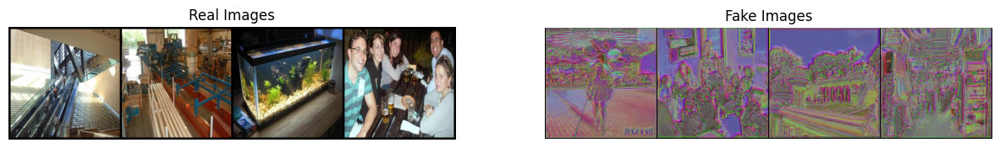

In [101]:
# Grab a batch of real images from the dataloader
real_batch = next(dl_iter)

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [111]:
test = next(dl_iter)[0]
test_mask = mask_batch(test)

In [106]:
from utils.notebook import imshow
from utils.tensor import tensor_to_numpy

In [115]:
test[0].shape

torch.Size([3, 256, 256])

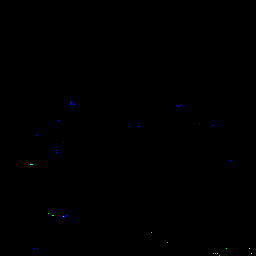

In [122]:
imshow(tensor_to_numpy(test[0], bgr=True))